In [1]:
%load_ext autoreload
%autoreload 2
from definitions import *
from matplotlib.colors import ListedColormap, LinearSegmentedColormap


# S300, SOM

In [2]:
exp_som = ClusteringExperiment('ERA5', 'Wind', '300', None, None, -80, 40, 20, 80, False, 'anomaly', 'JJA')


In [3]:
net, centers = exp_som.compute_som(6, 10, 180, False, False, True, inner_dist_type='grid', train_kwargs=dict(train_algo='online'))


2023-04-24 13:15:11.442 | INFO     | simpsom.network:__init__:113 - Periodic Boundary Conditions active.
2023-04-24 13:15:11.443 | INFO     | simpsom.network:__init__:124 - Hexagonal topology.
2023-04-24 13:15:11.444 | INFO     | simpsom.network:_set_weights:220 - The weights will be loaded from file


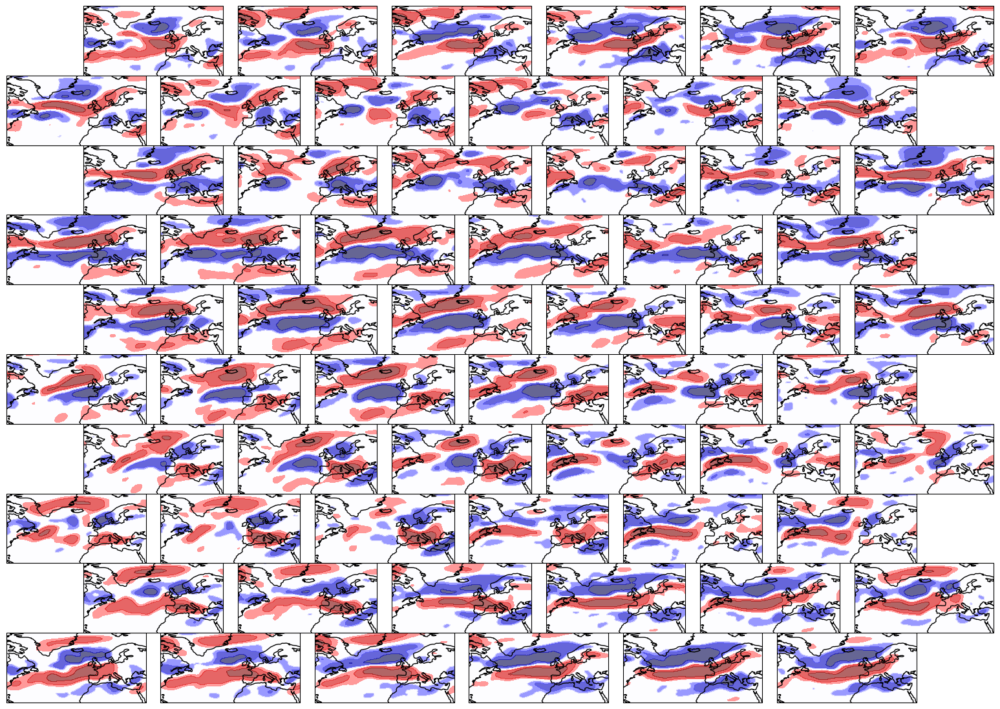

In [4]:
ncol, nrow = net.width, net.height
fig, axes = honeycomb_panel(ncol, nrow, None, dict(projection=ccrs.PlateCarree()))
tbd = []
lon = centers["lon"].values
lat = centers["lat"].values
cmap_wind = mpl.colormaps['seismic']
qlist = [0.025, 0.1, 0.2, 0.8, 0.9, .975]
levels_wind = centers.quantile(qlist).values
norm_wind = BoundaryNorm(levels_wind, cmap_wind.N, extend='both')

for n, (i, j) in enumerate(product(range(ncol), range(nrow))):
    ax = axes[i, j]
    ax.set_xticks([])
    ax.set_yticks([])
    ax.contourf(
        lon, lat, centers.isel(x=i, y=j), cmap=cmap_wind, levels=levels_wind, norm=norm_wind, extend='both', alpha=0.6
    )
    ax.add_feature(COASTLINE)


In [5]:
projected = net.project_onto_map(net.data)
da_som = exp_som.open_da('anomaly', 'JJA')
indices = net.bmus

2023-04-24 13:15:15.370 | INFO     | simpsom.network:project_onto_map:553 - Projected coordinates will be saved to:
././som_projected.npy


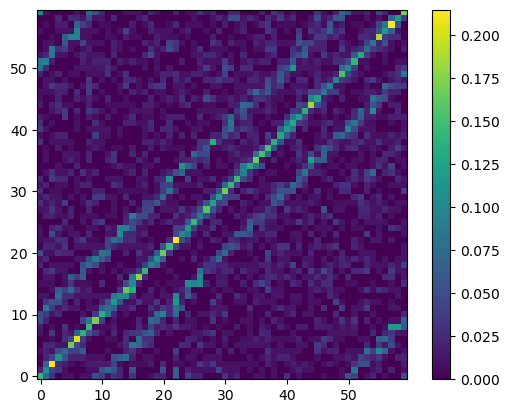

In [6]:
trans_mat = net.compute_transmat(step=1)
fig, ax = plt.subplots()
im = ax.imshow(trans_mat, origin="lower")
fig.colorbar(im, ax=ax)


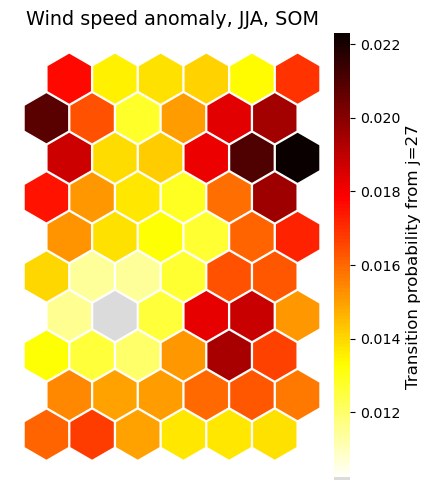

In [12]:
cmap = mpl.colormaps["hot"].reversed()(np.linspace(0, 1, 128))
cmap[:1, :3] = (np.asarray([220, 220, 220]) / 256)[None, :]
cmap = ListedColormap(cmap)
j = np.random.randint(0, net.width * net.height)
kwargs = {
    "cmap": cmap,
    "cbar_label": f"Transition probability from {j=}",
    "title": "Wind speed anomaly, JJA, SOM",
    "levels": np.arange(15),
}
probas = trans_mat[:, j]
fig, ax = net.plot_on_map(
    probas,
    smooth_sigma=1,
    show=True,
    **kwargs
)


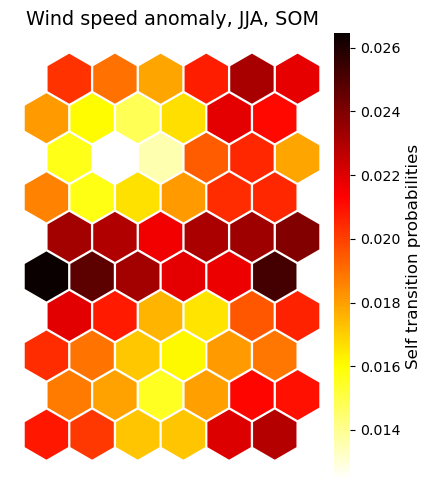

In [13]:
cmap = mpl.colormaps["hot"].reversed()
kwargs = {
    "cmap": cmap,
    "cbar_label": f"Self transition probabilities",
    "title": "Wind speed anomaly, JJA, SOM",
    "levels": np.arange(15),
}

fig, ax = net.plot_on_map(
    np.diag(trans_mat),
    smooth_sigma=1,
    show=True,
    **kwargs
)

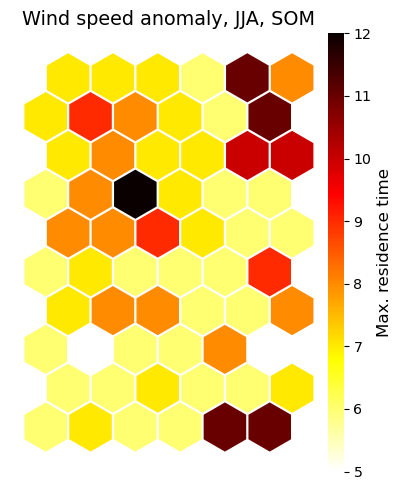

In [15]:
rt_max = net.compute_residence_time('max', smooth_sigma=1)

kwargs = {
    "cmap": cmap,
    "cbar_label": f"Max. residence time",
    "title": "Wind speed anomaly, JJA, SOM",
    "levels": np.arange(15),
}

fig, ax = net.plot_on_map(
    rt_max,
    smooth_sigma=0,
    **kwargs
)

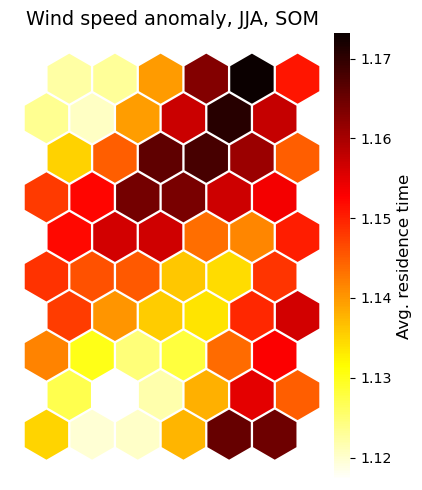

In [16]:
rt_max = net.compute_residence_time('mean', smooth_sigma=0)

kwargs = {
    "cmap": cmap,
    "cbar_label": f"Avg. residence time",
    "title": "Wind speed anomaly, JJA, SOM",
    "levels": np.arange(15),
}

fig, ax = net.plot_on_map(
    rt_max,
    smooth_sigma=1,
    **kwargs
)

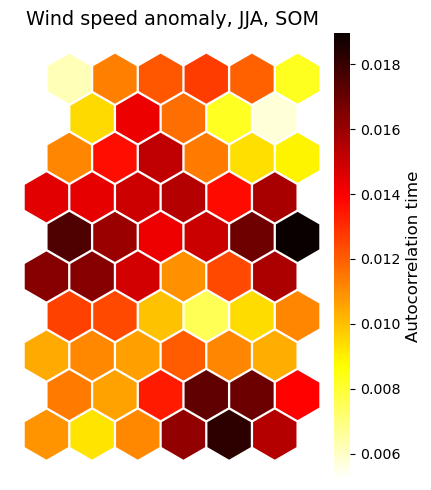

In [19]:
acorr = net.compute_autocorrelation(lag_max=30)

kwargs = {
    "cmap": cmap,
    "cbar_label": f"Autocorrelation time",
    "title": "Wind speed anomaly, JJA, SOM",
    "levels": np.arange(15),
}

fig, ax = net.plot_on_map(
    acorr[3, :],
    smooth_sigma=1,
    **kwargs
)

/storage/homefs/hb22g102/mambaforge/envs/env11/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/storage/homefs/hb22g102/mambaforge/envs/env11/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


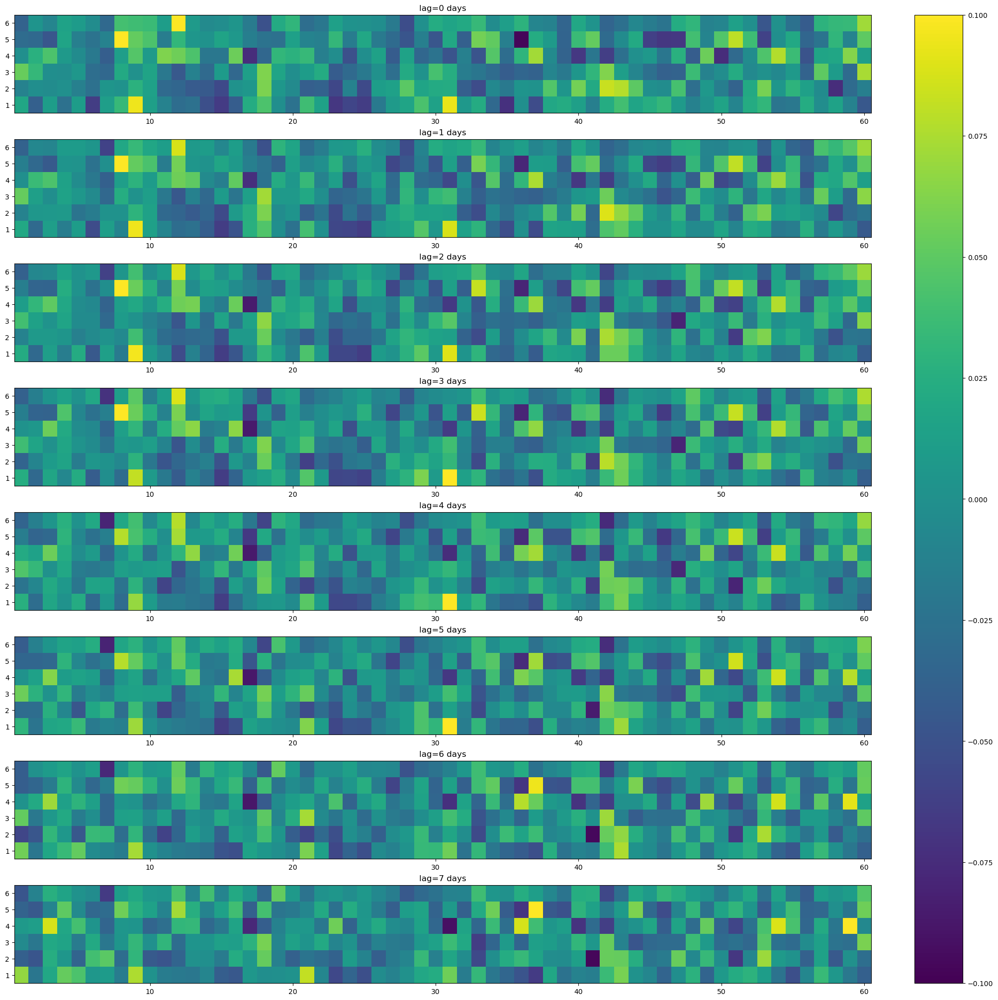

In [93]:
hs_mask = hotspells_mask(timerange=DATERANGEPL_SUMMER)
groups = list(hs_mask.resample(time='1YS').groups.values())
node_mask = indices[:, None] == np.arange(net.n_nodes)[None, :]
fig, axes = plt.subplots(8, 1, figsize=(20, 20), constrained_layout=True)
for lag, ax in enumerate(axes):
    xcorr = np.zeros((len(groups), node_mask.shape[1], hs_mask.shape[1]))
    for i, group in enumerate(groups):
        this_hs_mask = hs_mask.values[group, :]
        this_node_mask = node_mask[group, :]
        nt = this_hs_mask.shape[0]
        to_corr = np.concatenate([np.roll(this_hs_mask, -lag, axis=0)[:nt - lag], this_node_mask[:nt - lag]], axis=1)
        xcorr[i] = np.corrcoef(to_corr, rowvar=False)[hs_mask.shape[1]:, :hs_mask.shape[1]]
    to_plot = np.nan_to_num(np.nanmean(xcorr, axis=0), nan=0)
    im = ax.pcolormesh(np.arange(1, node_mask.shape[1] + 1), np.arange(1, hs_mask.shape[1] + 1), to_plot.T, shading='nearest', vmin=-0.1, vmax=0.1)
    ax.set_title(f'{lag=} days')
fig.colorbar(im, ax=axes)

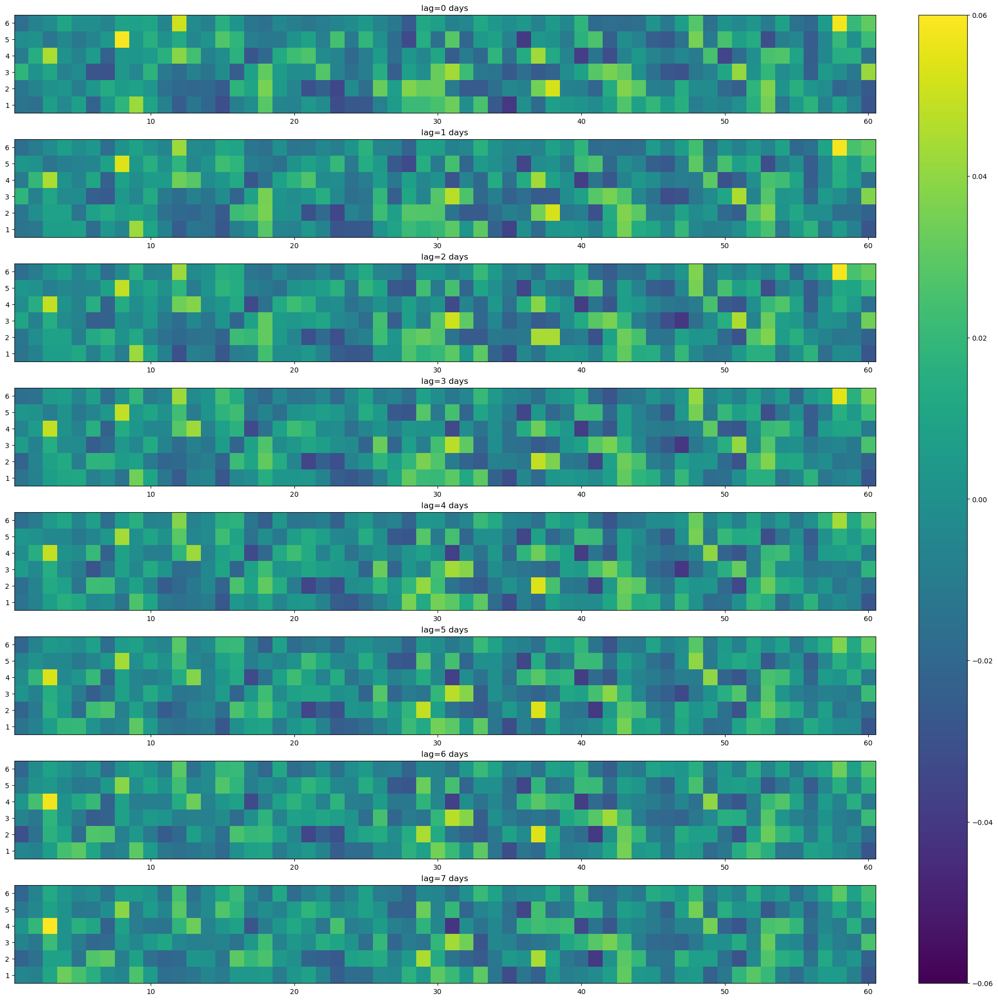

In [72]:
hs_mask = hotspells_mask(timerange=DATERANGEPL_SUMMER)

node_mask = indices[:, None] == np.arange(net.n_nodes)[None, :]
fig, axes = plt.subplots(8, 1, figsize=(20, 20), constrained_layout=True)
axes = axes.flatten()
nt = hs_mask.shape[0]
for lag, ax in enumerate(axes):
    to_corr = np.concatenate([np.roll(hs_mask, -lag, axis=0)[:nt - lag], node_mask[:nt - lag]], axis=1)
    xcorr = np.corrcoef(to_corr, rowvar=False)[hs_mask.shape[1]:, :hs_mask.shape[1]]
    im = ax.pcolormesh(np.arange(1, node_mask.shape[1] + 1), np.arange(1, hs_mask.shape[1] + 1), xcorr.T, shading='nearest', vmin=-0.06, vmax=0.06)
    ax.set_title(f'{lag=} days')
fig.colorbar(im, ax=axes)


In [73]:
xcorr.shape

(60, 6)

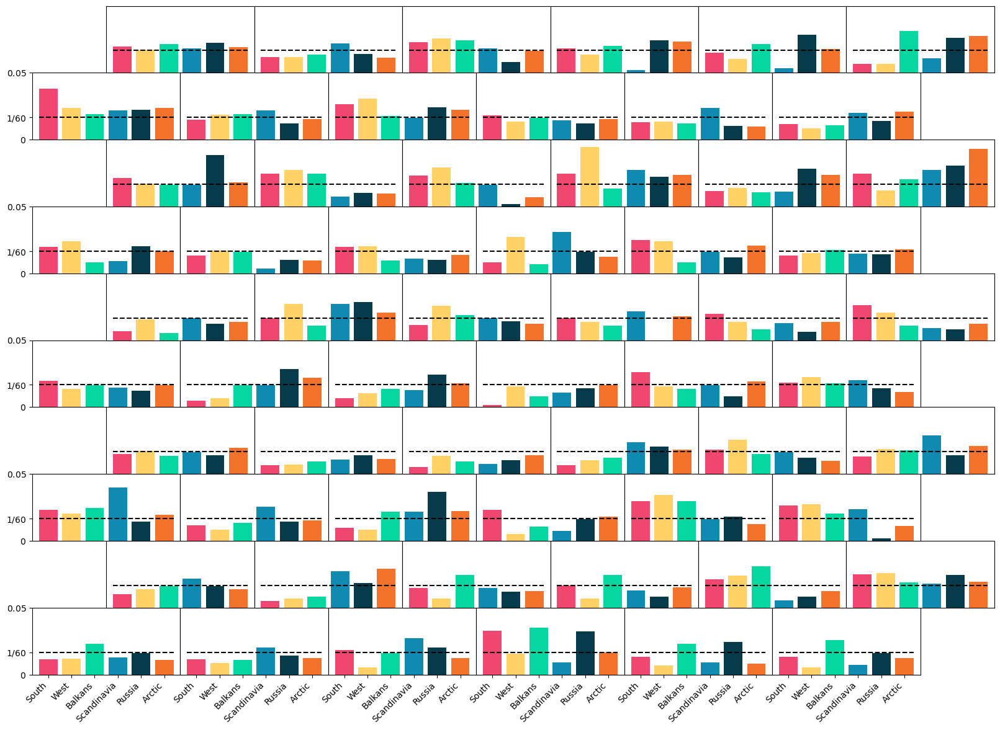

In [9]:
i = 0
probas = np.sum(np.roll(node_mask[i:, :, None], shift=i, axis=0) & hs_mask[i:, None, :], axis=0) / np.sum(hs_mask, axis=0)[None, :]
fig, axes = honeycomb_panel(net.width, net.height)
for ax, proba in zip(axes.flatten(), probas):
    ax.bar(np.arange(6), proba, color=COLORS5)
    y = 1 / probas.shape[0]
    ax.plot([- 0.4, 5.4], [y, y], color='black', ls='dashed', zorder=10)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_ylim([0, 0.05])
for ax in axes[0, ::2]:
    ax.set_yticks([0., y, 0.05], [r'$0$', r'$1/60$', r'$0.05$'])
for ax in axes[:, 0]:
    ax.set_xticks(np.arange(6), ["South", "West", "Balkans", "Scandinavia", "Russia", "Arctic"], rotation=45, ha='right')

In [10]:
varnames = ['Lat', 'Int', 'Tilt', 'Dep', 'Mea']
Zoo = xr.open_dataset('/storage/scratch/users/hb22g102/ERA5/Wind/Low/box_-80_40_20_80/Zoo.nc')
Zoo = Zoo[varnames].isel(time=Zoo.time.dt.season=='JJA')
mu = Zoo.mean(dim='time')
sigma = Zoo.std(dim='time', ddof=1)

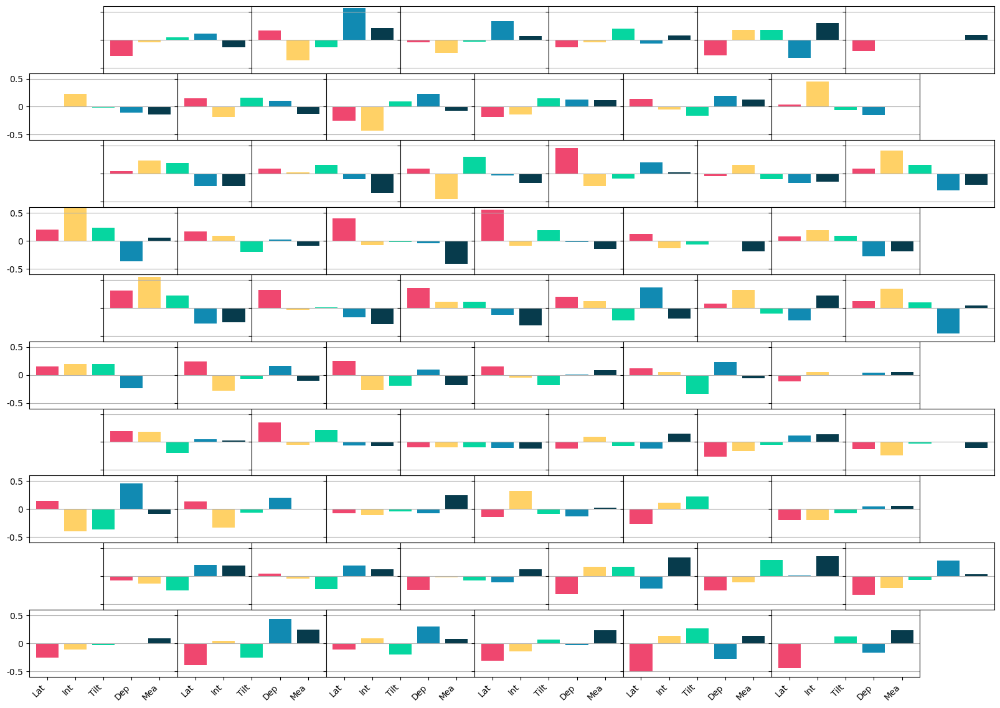

In [16]:
fig, axes = honeycomb_panel(net.width, net.height)
for ax, mask in zip(axes.flatten(), node_mask.T):
    thismu = Zoo.isel(time=mask).mean(dim='time')
    to_plot = [(thismu[vn] - mu[vn]) / sigma[vn] for vn in varnames]
    ax.bar(np.arange(len(varnames)), to_plot, color=COLORS5, label=varnames)
    ax.set_ylim([-0.6, 0.6])
    ax.set_xticks([])
    ax.set_yticks([-0.5, 0, 0.5], ['', '', ''])
    ax.grid(True, axis='y')
for ax in axes[0, ::2]:
    ax.set_yticks([-0.5, 0, 0.5], ['-0.5', '0', '0.5'])
for ax in axes[:, 0]:
    ax.set_xticks(np.arange(5), varnames, rotation=45, ha='right')

In [18]:
exp_T = Experiment(exp_som.dataset, 'Temperature', '2m', exp_som.region, 't')
da_T = exp_T.open_da('anomaly', 'JJA')
da_T = da_T.drop_duplicates(dim='time').interp(time=da_som.time)


In [19]:
multimask = (indices[:, None] == np.arange(net.height * net.width)[None, :]).reshape(-1, net.width, net.height)

In [20]:
center_temps = xr.DataArray(np.empty((net.width, net.height, *da_T.shape[1:])), coords=centers.coords)
for i, j in product(range(net.width), range(net.height)):
    center_temps[i, j] = da_T.isel(time=multimask[:, i, j]).mean(dim='time')

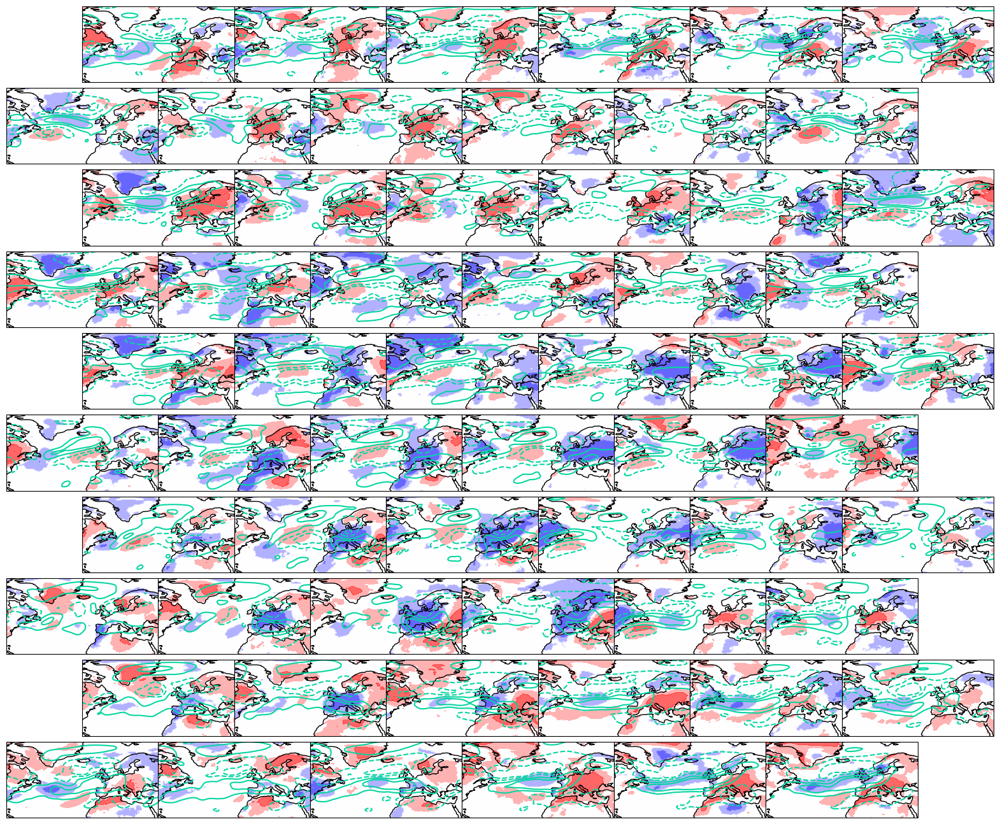

In [28]:
ncol, nrow = net.width, net.height
ratio = (da_som.lat[-1] - da_som.lat[0]) / (da_som.lon[-1] - da_som.lon[0])  * nrow / ncol
fig, axes = honeycomb_panel(ncol, nrow, ratio, dict(projection=ccrs.PlateCarree()))
tbd = []
lon = centers["lon"].values
lat = centers["lat"].values
cmap_temp = mpl.colormaps['bwr']
cmap_wind = mpl.colormaps['BrBG']
qlist = [0.025, 0.15, 0.85, .975]
levels_temp = center_temps.quantile(qlist).values
norm_temp = BoundaryNorm(levels_temp, cmap_temp.N, extend='both')
levels_wind = centers.quantile(qlist).values

for n, (i, j) in enumerate(product(range(ncol), range(nrow))):
    ax = axes[i, j]
    ax.set_xticks([])
    ax.set_yticks([])
    ax.contourf(
        lon, lat, center_temps.isel(x=i, y=j), cmap=cmap_temp, levels=levels_temp, norm=norm_temp, extend='both', alpha=0.6
    )
    ax.contour(
        lon, lat, centers.isel(x=i, y=j), levels=levels_wind, colors=COLORS5[2]
    )
    ax.add_feature(COASTLINE)
# if i % 2 == 0:
#     tbd.append(fig.add_subplot(gs[i, -1]).set_visible(False))
# else:
#     tbd.append(fig.add_subplot(gs[i, 0]).set_visible(False))


In [38]:
q95 = da_T.quantile(0.95, dim='time')
center_counts = xr.DataArray(np.empty((net.width, net.height, *da_T.shape[1:])), coords=centers.coords)
for i, j in product(range(net.width), range(net.height)):
    center_counts[i, j] = (da_T.isel(time=multimask[:, i, j]) > q95).sum(dim='time')

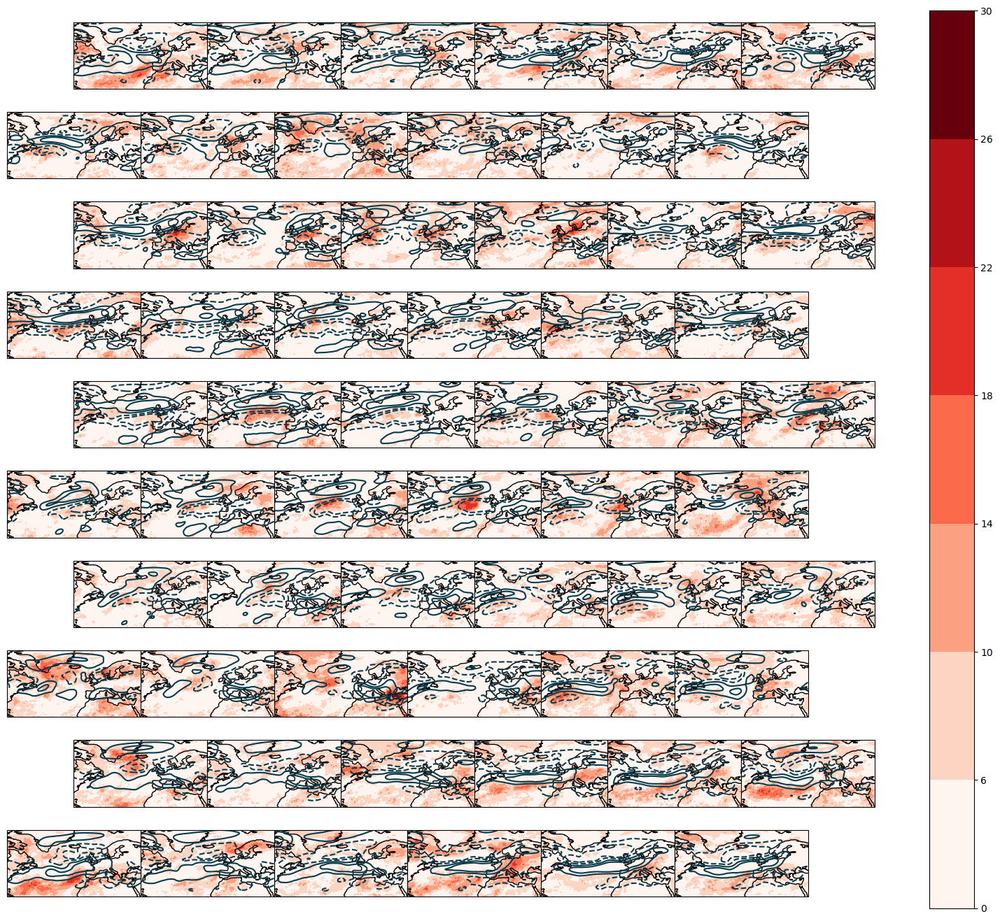

In [51]:
from matplotlib.cm import ScalarMappable
ncol, nrow = net.width, net.height
ratio = (da_som.lat[-1] - da_som.lat[0]) / (da_som.lon[-1] - da_som.lon[0])  * nrow / ncol
fig, axes = honeycomb_panel(ncol, nrow, ratio, dict(projection=ccrs.PlateCarree()))
tbd = []
lon = centers["lon"].values
lat = centers["lat"].values
cmap_temp = mpl.colormaps['Reds']
cmap_wind = mpl.colormaps['BrBG']
# qlist = np.linspace(0, 1, 6)
# levels_temp = center_counts.quantile(qlist).values
levels_temp = np.append(0, np.arange(6, 31, 4))
norm_temp = BoundaryNorm(levels_temp, cmap_temp.N, extend='neither')
im = ScalarMappable(norm_temp, cmap_temp)
qlist = [0.025, 0.15, 0.85, .975]
levels_wind = centers.quantile(qlist).values

for n, (i, j) in enumerate(product(range(ncol), range(nrow))):
    ax = axes[i, j]
    ax.set_xticks([])
    ax.set_yticks([])
    ax.contourf(
        lon, lat, center_counts.isel(x=i, y=j), cmap=cmap_temp, levels=levels_temp, norm=norm_temp, extend='neither'
    )
    ax.contour(
        lon, lat, centers.isel(x=i, y=j), levels=levels_wind, colors=COLORS5[4]
    )
    ax.add_feature(COASTLINE)
fig.colorbar(im, ax=axes)
# if i % 2 == 0:
#     tbd.append(fig.add_subplot(gs[i, -1]).set_visible(False))
# else:
#     tbd.append(fig.add_subplot(gs[i, 0]).set_visible(False))


## Intransivity

In [147]:
allnodes = np.arange(net.width * net.height)
indices_mask = indices[:, None] == np.arange(net.width * net.height)[None, :]
indices_mask = xr.DataArray(indices_mask, coords={'time': da_som.time.values, 'node': allnodes})

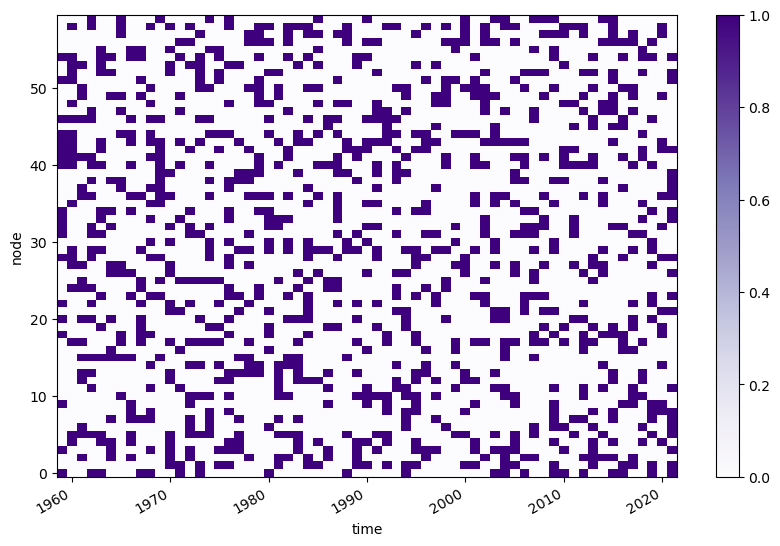

In [148]:
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
cmap = LinearSegmentedColormap.from_list(
    "gr",
    [
        [21 / 256, 176 / 256, 26 / 256, 1],
        [1, 1, 1, 1],
        [229 / 256, 0, 0, 1],
    ],
    N=50,
)
to_plot = indices_mask.resample(time='1YS').any(dim='time').T
(~to_plot).plot.pcolormesh(cmap='Purples') #, linewidth=.5, edgecolors='white')

# OPPS

In [96]:
eigenvals, OPPs, path = exp_som.compute_opps(180, return_realspace=True)
raw_OPPs = load_pickle(path)['OPPs']

In [97]:
X, da = exp_som.prepare_for_clustering()
OPP_timeseries = exp_som.opp_transform(X, 180)
mask_high_val = OPP_timeseries > 2
mask_low_val = OPP_timeseries < -2

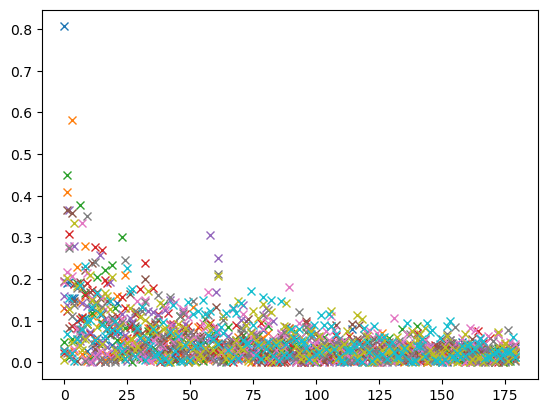

In [98]:
for i in range(10):
    plt.plot(np.abs(raw_OPPs[i, :]), 'x')

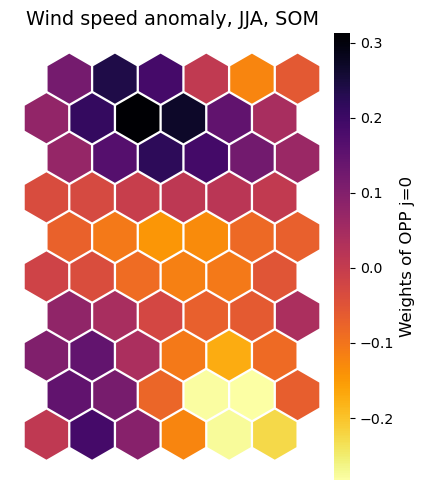

In [99]:
j = 0
kwargs = {
    "cmap": mpl.colormaps["inferno"].reversed(),
    "cbar_label": f"Weights of OPP {j=}",
    "title": "Wind speed anomaly, JJA, SOM",
}

fig, ax = net.plot_on_map(
    (net.weights @ raw_OPPs.T)[:, j],
    **kwargs,
    smooth_sigma=0,
)

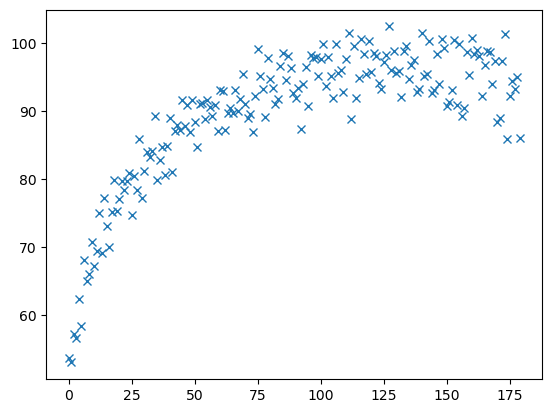

In [100]:
plt.plot(np.average(np.broadcast_to(np.arange(180)[None, :], raw_OPPs.shape), weights=np.abs(raw_OPPs), axis=1), 'x')

(<Figure size 1900x900 with 7 Axes>,
 array([<GeoAxes: >, <GeoAxes: >, <GeoAxes: >, <GeoAxes: >, <GeoAxes: >,
        <GeoAxes: >], dtype=object),
 <matplotlib.colorbar.Colorbar at 0x7f5e45b9de90>)

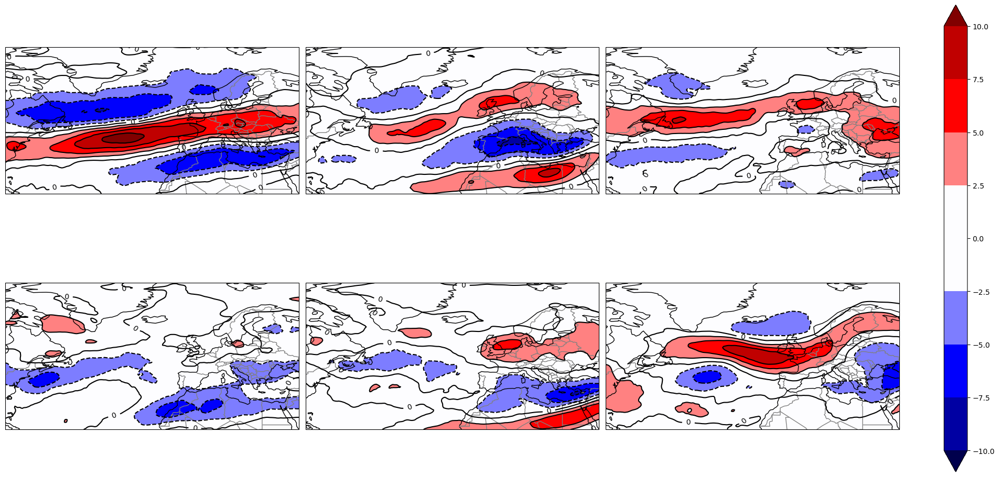

In [101]:
to_plot = [da.isel(time=mask_high_val[:, i]).mean(dim='time') for i in range(6)]
clusterplot(2, 3, to_plot, 5, 10, clabels=[0])

(<Figure size 1900x900 with 7 Axes>,
 array([<GeoAxes: >, <GeoAxes: >, <GeoAxes: >, <GeoAxes: >, <GeoAxes: >,
        <GeoAxes: >], dtype=object),
 <matplotlib.colorbar.Colorbar at 0x7f5e466e28d0>)

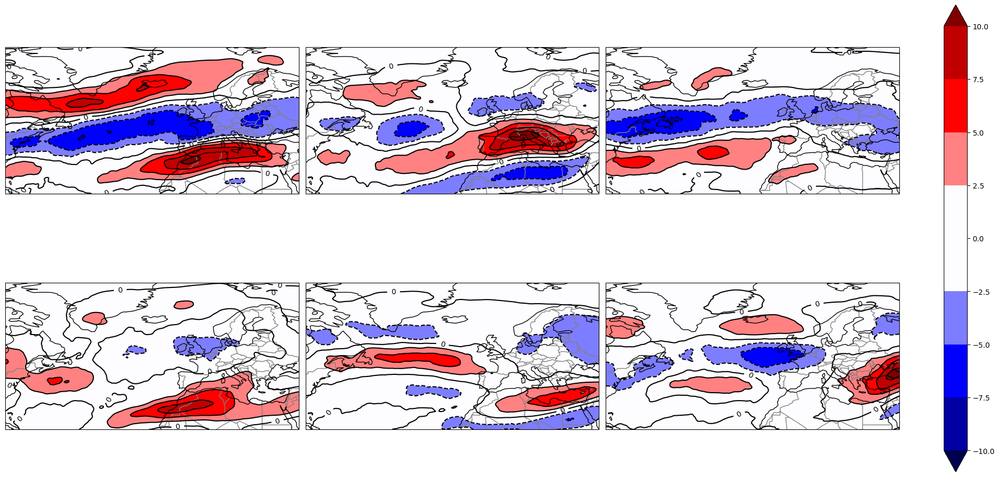

In [102]:
to_plot = [da.isel(time=mask_low_val[:, i]).mean(dim='time') for i in range(6)]
clusterplot(2, 3, to_plot, 5, 10, clabels=[0])

(<Figure size 1900x900 with 7 Axes>,
 array([<GeoAxes: >, <GeoAxes: >, <GeoAxes: >, <GeoAxes: >, <GeoAxes: >,
        <GeoAxes: >], dtype=object),
 <matplotlib.colorbar.Colorbar at 0x7f5e440ce550>)

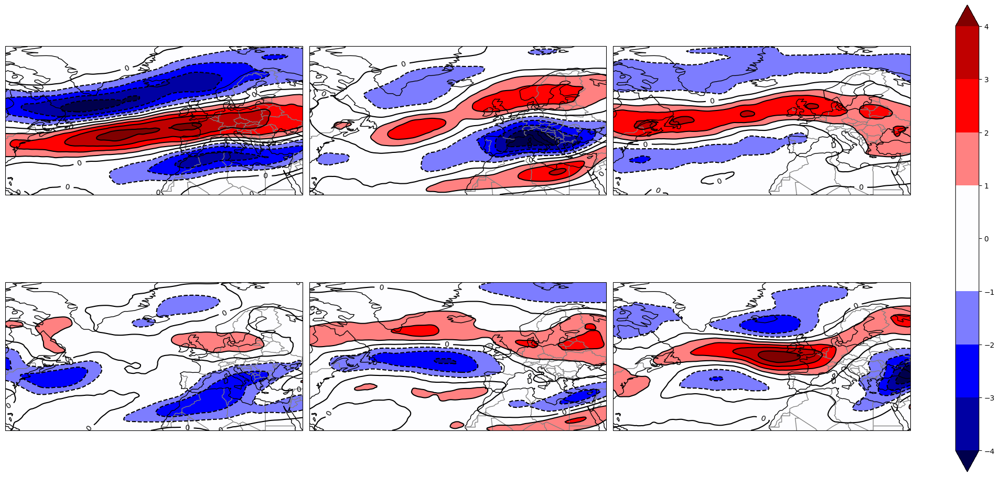

In [103]:
to_plot = OPPs[:6]
clusterplot(2, 3, to_plot, 5, 4, clabels=[0])

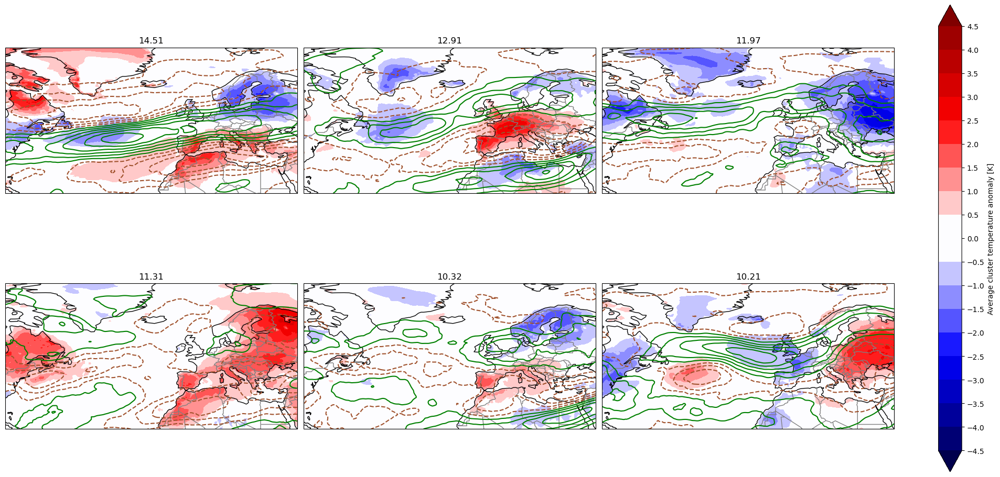

In [104]:
to_plot = [da_T.isel(time=mask_high_val[:, i]).mean(dim='time') for i in range(6)]
fig, axes, cbar = clusterplot(2, 3, to_plot, 10, 4.5, clabels=None, contours=False, cbar_ylabel='Average cluster temperature anomaly [K]')
to_plot = [da.isel(time=mask_high_val[:, i]).mean(dim='time') for i in range(6)]
levels = 12
levels2 = int(levels / 2)
colors = levels2 * ['sienna'] + (levels2 + 1) * ['green']
linestyles = levels2 * ['dashed'] + (levels2 + 1) * ['solid']
for ax, toplt, eigenval in zip(axes, to_plot, eigenvals):
    toplt.plot.contour(ax=ax, add_colorbar=False, add_labels=False, levels=levels, vmin=-10, vmax=10, colors=colors, linestyles=linestyles)
    ax.set_title(f'{eigenval:.2f}')

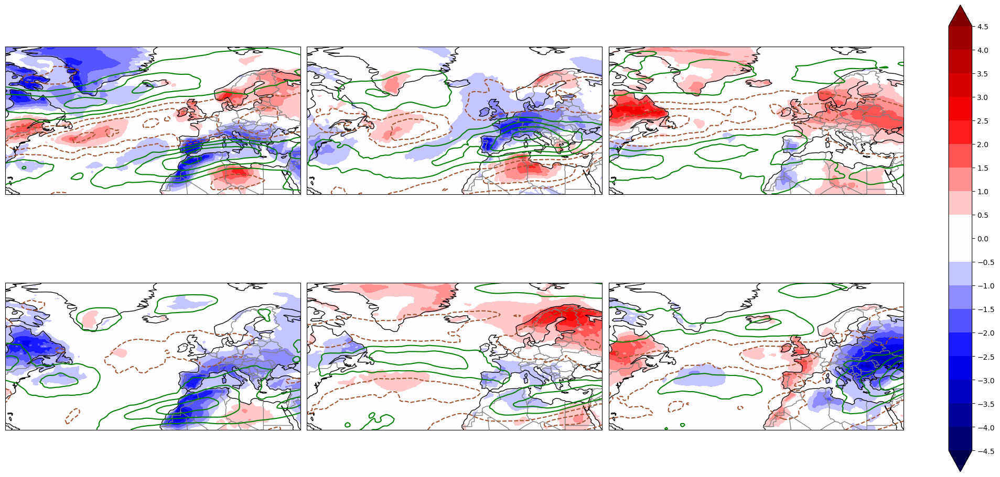

In [105]:
to_plot = [da_T.isel(time=mask_low_val[:, i]).mean(dim='time') for i in range(6)]
fig, axes, cbar = clusterplot(2, 3, to_plot, 10, 4.5, clabels=None, contours=False)
to_plot = [da.isel(time=mask_low_val[:, i]).mean(dim='time') for i in range(6)]
levels = 8
levels2 = int(levels / 2)
colors = levels2 * ['sienna'] + (levels2 + 1) * ['green']
linestyles = levels2 * ['dashed'] + (levels2 + 1) * ['solid']
for ax, toplt in zip(axes, to_plot):
    toplt.plot.contour(ax=ax, add_colorbar=False, add_labels=False, levels=levels, vmin=-10, vmax=10, colors=colors, linestyles=linestyles)

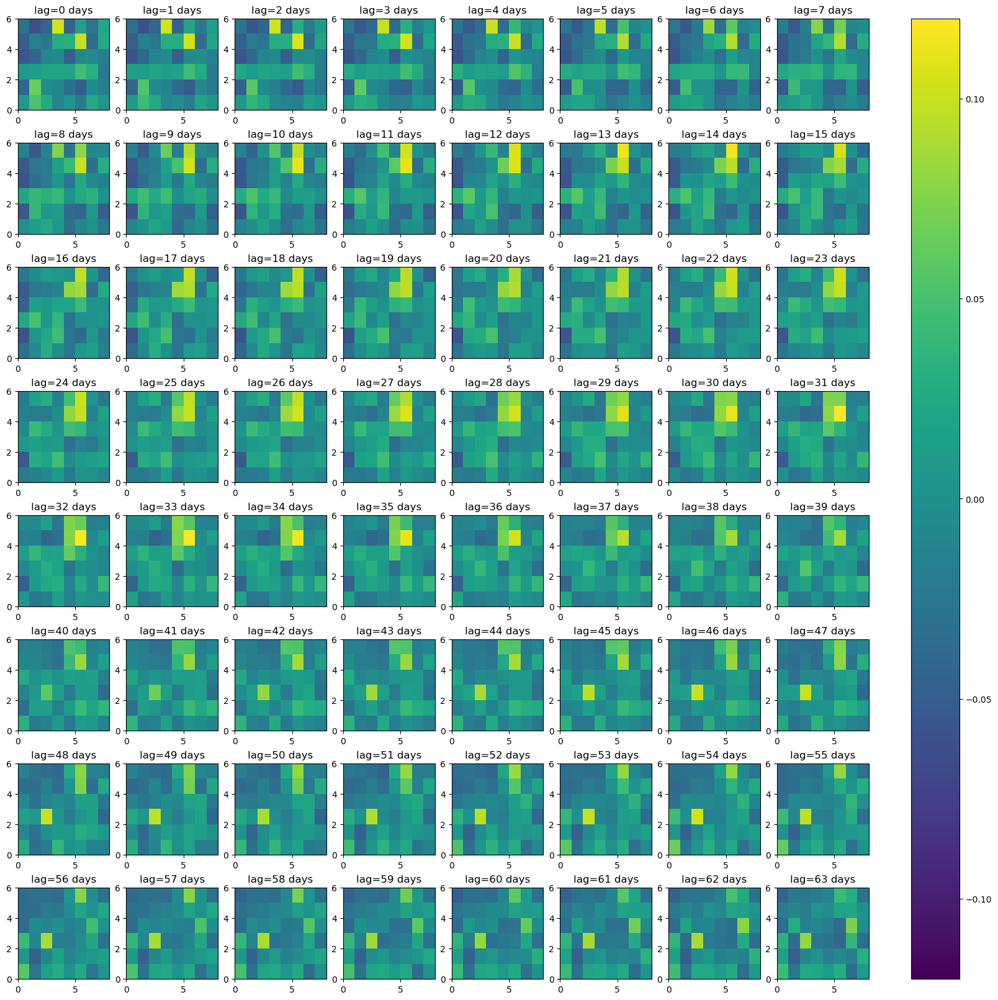

In [138]:
daterange_summer = DATERANGEPL[np.isin(DATERANGEPL.month, [6, 7, 8])]
hs_mask = hotspells_mask(timerange=daterange_summer).values
fig, axes = plt.subplots(8, 8, figsize=(16, 16), constrained_layout=True)
axes = axes.flatten()
nt = hs_mask.shape[0]
for lag, ax in enumerate(axes):
    to_corr = np.concatenate([np.roll(hs_mask, -lag, axis=0)[:nt - lag], mask_high_val[:nt - lag, :8]], axis=1)
    xcorr = np.corrcoef(to_corr, rowvar=False)[hs_mask.shape[1]:, :hs_mask.shape[1]]
    im = ax.pcolormesh(xcorr.T, vmin=-0.12, vmax=0.12)
    ax.set_title(f'{lag=} days')
fig.colorbar(im, ax=axes)

# Hotspells

In [80]:
duncan_mask = xr.open_dataarray(f'{DATADIR}/ERA5/clusters_n6_eu_3w-def_correct-order.nc').fillna(0).astype(int)
exp_T = Experiment(exp_som.dataset, 'Temperature', '2m', None, 't', -25, 60, 32, 72)
da_T = exp_T.open_da(season='JJA')

daterange_summer = DATERANGEPL[np.isin(DATERANGEPL.month, [6, 7, 8])]
da_T = da_T.drop_duplicates(dim='time').interp(time=daterange_summer, lon=duncan_mask.lon, lat=duncan_mask.lat)
da_T = da_T.assign_coords({'mask': np.abs(duncan_mask)})


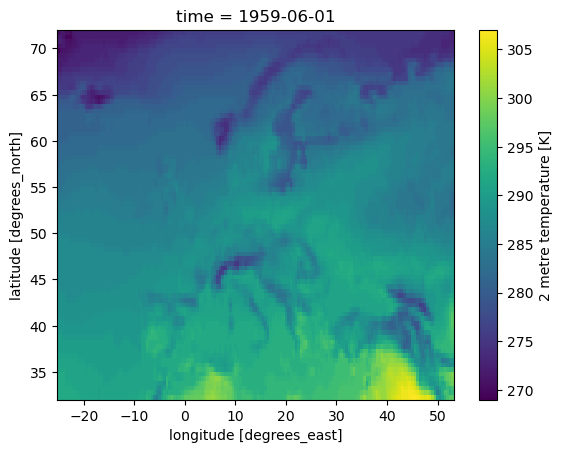

In [81]:
da_T.isel(time=0).plot()

In [82]:
da_T.mask == 1

<xarray.DataArray 'mask' (lat: 80, lon: 157)>
array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])
Coordinates:
  * lon      (lon) float64 -25.0 -24.5 -24.0 -23.5 -23.0 ... 51.5 52.0 52.5 53.0
  * lat      (lat) float64 32.25 32.75 33.25 33.75 ... 70.25 70.75 71.25 71.75
    mask     (lat, lon) int64 0 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0

In [89]:
q = 0.95
for i in range(1, 7):
    maskedarray = da_T.where(da_T.mask == i)
    thisq = maskedarray.quantile(q)
    

<xarray.DataArray 't' ()>
array(296.)
Coordinates:
    quantile  float64 0.95